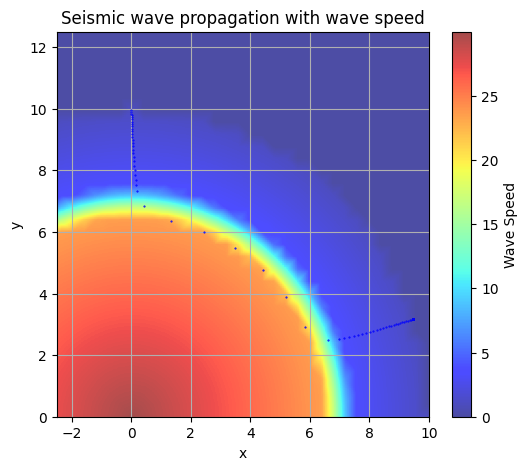

In [35]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from scipy.interpolate import griddata

# データファイルのパス
file_pat_x = 'seismic_x.dat'
file_pat_y = 'seismic_y.dat'
file_pat_t = 'seismic_t.dat'
file_speed = 'seismic_speed.dat'

# データの読み込み
data_x = np.genfromtxt(file_pat_x, delimiter=None, invalid_raise=False, filling_values=np.nan)
data_y = np.genfromtxt(file_pat_y, delimiter=None, invalid_raise=False, filling_values=np.nan)
data_t = np.genfromtxt(file_pat_t, delimiter=None, invalid_raise=False, filling_values=np.nan)

# wave_speed データの読み込み
data_speed = np.loadtxt(file_speed)

# x, y, speed の取得
x_speed = data_speed[:, 0]
y_speed = data_speed[:, 1]
speed = data_speed[:, 2]

# (x_speed, y_speed) を 2D 座標リストに変換
points = np.column_stack((x_speed, y_speed))

# グリッド作成（カラーマップ用）
y_min, y_max = 0, 12.5
x_min, x_max = -2.5, 10
y_grid = np.linspace(y_min, y_max, 200)
x_grid = np.linspace(x_min, x_max, 200)
X, Y = np.meshgrid(x_grid, y_grid)

# X, Y を (M*N, 2) の形に変換
grid_points = np.column_stack((X.ravel(), Y.ravel()))

# griddata を適用
speed_grid = griddata(points, speed, grid_points, method="linear", fill_value=0.0)

# 2D グリッドに戻す
speed_grid = speed_grid.reshape(X.shape)

# 図の設定
fig, ax = plt.subplots(figsize=(6, 5))
ax.set_title("Seismic wave propagation with wave speed")
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
ax.grid()

# 背景のカラーマップを表示
im = ax.imshow(speed_grid, extent=[x_min, x_max, y_min, y_max], origin="lower", cmap="jet", alpha=0.7, aspect="auto")

# カラーバーを追加
cbar = plt.colorbar(im, ax=ax)
cbar.set_label("Wave Speed")


ax.plot(data_x[:, 3830], data_y[:, 3830], c="blue", marker=".", markersize=1.0, linewidth=0)
plt.show()

In [41]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from scipy.interpolate import griddata
from IPython.display import HTML

# データファイルのパス
file_pat_x = 'seismic_x.dat'
file_pat_y = 'seismic_y.dat'
file_pat_t = 'seismic_t.dat'
file_speed = 'seismic_speed.dat'

# データの読み込み
data_x = np.genfromtxt(file_pat_x, delimiter=None, invalid_raise=False, filling_values=np.nan)
data_y = np.genfromtxt(file_pat_y, delimiter=None, invalid_raise=False, filling_values=np.nan)
data_t = np.genfromtxt(file_pat_t, delimiter=None, invalid_raise=False, filling_values=np.nan)

# wave_speed データの読み込み
data_speed = np.loadtxt(file_speed)

# x, y, speed の取得
x_speed = data_speed[:, 0]
y_speed = data_speed[:, 1]
speed = data_speed[:, 2]

# (x_speed, y_speed) を 2D 座標リストに変換
points = np.column_stack((x_speed, y_speed))

# グリッド作成（カラーマップ用）
y_min, y_max = 0, 12.5
x_min, x_max = -2.5, 10
y_grid = np.linspace(y_min, y_max, 200)
x_grid = np.linspace(x_min, x_max, 200)
X, Y = np.meshgrid(x_grid, y_grid)

# X, Y を (M*N, 2) の形に変換
grid_points = np.column_stack((X.ravel(), Y.ravel()))

# griddata を適用
speed_grid = griddata(points, speed, grid_points, method="linear", fill_value=0.0)

# 2D グリッドに戻す
speed_grid = speed_grid.reshape(X.shape)

# 図の設定
fig, ax = plt.subplots(figsize=(6, 5))
ax.set_title("Seismic wave propagation with wave speed")
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
ax.grid()

# 背景のカラーマップを表示
im = ax.imshow(speed_grid, extent=[x_min, x_max, y_min, y_max], origin="lower", cmap="jet", alpha=0.7, aspect="auto")

# カラーバーを追加
cbar = plt.colorbar(im, ax=ax)
cbar.set_label("Wave Speed")

# プロットの初期化
line, = ax.plot([], [], c="blue", marker=".", markersize=1.0, linewidth=0)

# アニメーションの更新関数
def update(frame):
    if frame >= len(data_x):
        return line,

    valid_x = np.array(data_x[frame])
    valid_y = np.array(data_y[frame])
    
    # NaN を含むデータを除外
    nan_mask = ~np.isnan(valid_x) & ~np.isnan(valid_y)
    valid_x, valid_y = valid_x[nan_mask], valid_y[nan_mask]

    line.set_data(valid_x, valid_y)
    return line,

# フレーム数を適切に設定
frames_count = min(len(data_x), len(data_y))
anim = animation.FuncAnimation(fig, update, frames=frames_count, interval=100, blit=False)
plt.close()

# Jupyter Notebook でアニメーションを表示
HTML(anim.to_jshtml())
